In [1]:
# faceMask hDDM face ratings analysis script: mask analyses of false negatives (failing to ID correct emotion)
# 12/07/20

# note: to be run within python 3.5 environment named "hddm" (from console: 'source activate hddm')
# confirm jupyter notebook is launching from "hddm" environment (see top-right: 'conda env:hddm')

# set up
import numpy as np
print(np.__version__) # should be 1.11.3

import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from patsy import dmatrix

import hddm
print(hddm.__version__) # should be 0.6.0

1.11.3
0.6.0


C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\IPython\parallel.py:13: ShimWarning: The `IPython.parallel` package has been deprecated since IPython 4.0. You should import from ipyparallel instead.
  "You should import from ipyparallel instead.", ShimWarning)


In [2]:
# load hDDM-processed data from CSV file into a NumPy structured array
data = hddm.load_csv('faceMask_hddm_proc.csv')
                     
# flip 'no' response RTs to be negative
data = hddm.utils.flip_errors(data)

# check dataset
data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
0,gc2le9xecjp1stz,0,3,angry,0,_faces/22_F_R_U.jpg,22_F_R_U,22,F,surprised,upper,0,-4.636150,0,0,0,0,0,50
1,gc2le9xecjp1stz,0,3,angry,1,_faces/07_M_H_L.jpg,07_M_H_L,7,M,happy,lower,0,-2.079460,0,0,0,50,0,0
2,gc2le9xecjp1stz,0,3,angry,2,_faces/46_M_R_X.jpg,46_M_R_X,46,M,surprised,baseline,0,-1.847670,0,0,0,0,0,100
3,gc2le9xecjp1stz,0,3,angry,3,_faces/47_M_S_L.jpg,47_M_S_L,47,M,sad,lower,0,-6.506275,0,0,0,0,50,0
4,gc2le9xecjp1stz,0,3,angry,4,_faces/25_M_R_X.jpg,25_M_R_X,25,M,surprised,baseline,0,-1.536780,0,0,0,0,0,100
5,gc2le9xecjp1stz,0,3,angry,5,_faces/27_F_A_U.jpg,27_F_A_U,27,F,angry,upper,1,1.906175,50,0,0,0,0,0
6,gc2le9xecjp1stz,0,3,angry,6,_faces/08_F_S_U.jpg,08_F_S_U,8,F,sad,upper,0,-2.182530,0,0,0,0,50,0
7,gc2le9xecjp1stz,0,3,angry,7,_faces/38_M_H_X.jpg,38_M_H_X,38,M,happy,baseline,0,-1.445230,0,0,0,100,0,0
8,gc2le9xecjp1stz,0,3,angry,8,_faces/30_M_A_U.jpg,30_M_A_U,30,M,angry,upper,1,1.405270,50,0,0,0,0,0
9,gc2le9xecjp1stz,0,3,angry,9,_faces/04_F_R_U.jpg,04_F_R_U,4,F,surprised,upper,0,-1.945385,0,0,0,0,0,50


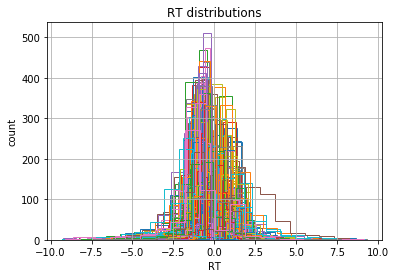

In [3]:
# plot RTs for each participant
fig = plt.figure()
ax = fig.add_subplot(111, xlabel='RT', ylabel='count', title='RT distributions')
for i, subj_data in data.groupby('subj_idx'):
    subj_data.rt.hist(bins=20, histtype='step', ax=ax)

In [4]:
# subset dataset by emotion rating type (happy) and facial expression (angry)
ha_data = data.loc[(data['emotionRating'] == 'happy') & (data['expression'] == 'angry')]
ha_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
320,gc2le9xecjp1stz,3,2,happy,325,_faces/31_F_A_U.jpg,31_F_A_U,31,F,angry,upper,0,-1.361910,50,0,0,0,0,0
330,gc2le9xecjp1stz,3,2,happy,335,_faces/20_M_A_X.jpg,20_M_A_X,20,M,angry,baseline,0,-0.965035,100,0,0,0,0,0
336,gc2le9xecjp1stz,3,2,happy,341,_faces/33_M_A_U.jpg,33_M_A_U,33,M,angry,upper,0,-1.227525,50,0,0,0,0,0
339,gc2le9xecjp1stz,3,2,happy,344,_faces/14_F_A_U.jpg,14_F_A_U,14,F,angry,upper,0,-1.181295,50,0,0,0,0,0
341,gc2le9xecjp1stz,3,2,happy,346,_faces/31_F_A_X.jpg,31_F_A_X,31,F,angry,baseline,0,-1.039530,100,0,0,0,0,0
347,gc2le9xecjp1stz,3,2,happy,352,_faces/71_M_A_U.jpg,71_M_A_U,71,M,angry,upper,0,-1.070160,50,0,0,0,0,0
350,gc2le9xecjp1stz,3,2,happy,355,_faces/14_F_A_L.jpg,14_F_A_L,14,F,angry,lower,0,-1.020220,50,0,0,0,0,0
381,gc2le9xecjp1stz,3,2,happy,386,_faces/61_F_A_U.jpg,61_F_A_U,61,F,angry,upper,0,-0.991625,50,0,0,0,0,0
383,gc2le9xecjp1stz,3,2,happy,388,_faces/71_M_A_L.jpg,71_M_A_L,71,M,angry,lower,0,-0.965180,50,0,0,0,0,0
385,gc2le9xecjp1stz,3,2,happy,390,_faces/33_M_A_X.jpg,33_M_A_X,33,M,angry,baseline,0,-1.096690,100,0,0,0,0,0


In [5]:
# drop any subjects missing columns in design matrix (otherwise produces error)
ha_data = ha_data[(ha_data.subj_idx != 'tc72s89kg5xex0v') & (ha_data.subj_idx != 'r2fdkawkrszpm2y')]

In [6]:
# define model
m_ha = hddm.HDDMRegressor(ha_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


 [-----------------100%-----------------] 5001 of 5000 complete in 42648.8 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean         std        2.5q         25q        50q        75q      97.5q       mc err
a                                   2.40528    0.867426     2.14936     2.29619    2.36682    2.43797    2.59213    0.0378848
a_std                              0.963679       1.716    0.729104    0.832649   0.891136   0.948568    1.08205    0.0714292
a_subj.02hcv424u29nd5w              3.32074     0.80745     2.13619     2.74222     3.2018     3.7634    5.26428    0.0332657
a_subj.02k2uwlhgxnumn9               2.1297    0.670199     1.17571     1.64423     2.0189    2.46708    3.74495    0.0338943
a_subj.03g7h2hzq4o3g26              3.70993    0.644056     2.67575     3.25227    3.62842    4.08953    5.16658    0.0197949
a_subj.0nmr75cysk1ae0e              3.09162    0.487183     2.30378     2.73886    3.02955    3.37515    4.22756    0.0140945
a_subj.0t8qp67pqkw36cb              2.69382    0.494909     1.92559     2.33514    2.62319    2.97967    3.83846    0.

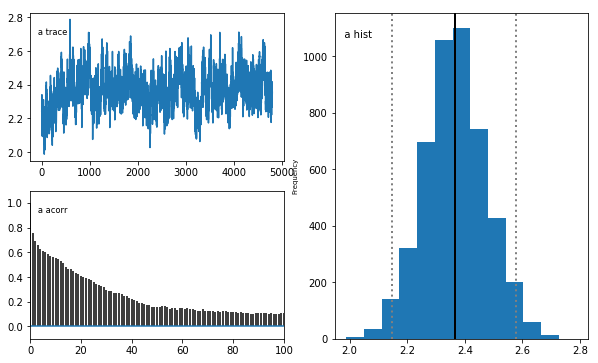

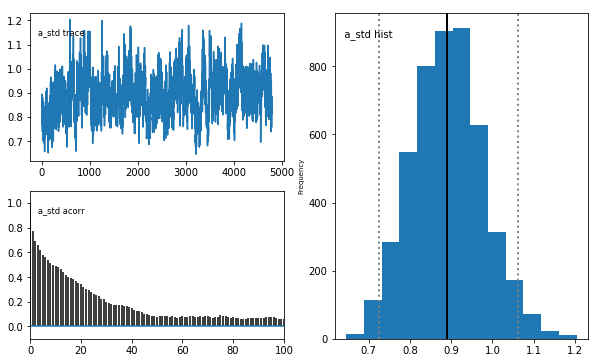

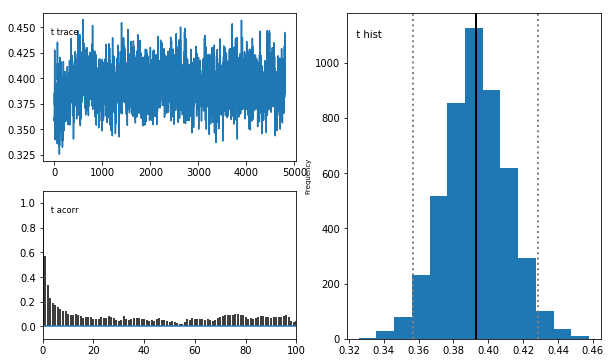

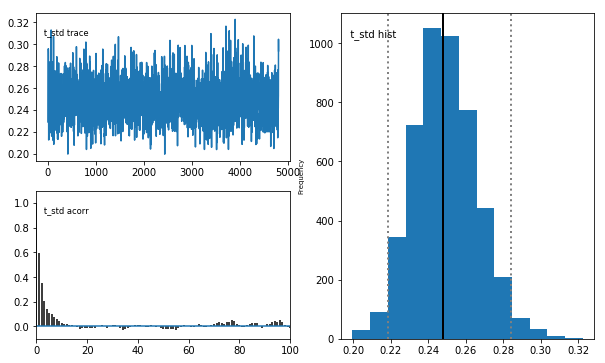

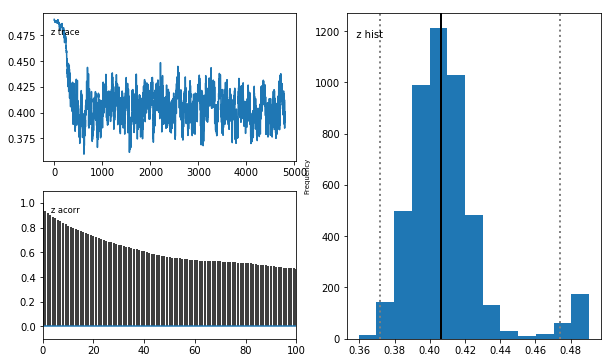

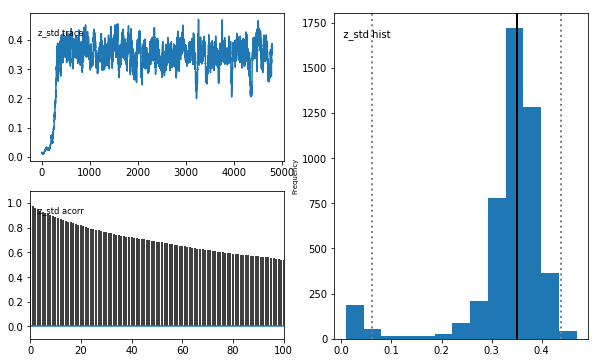

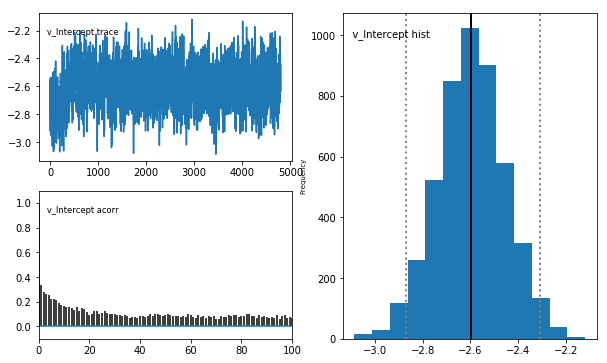

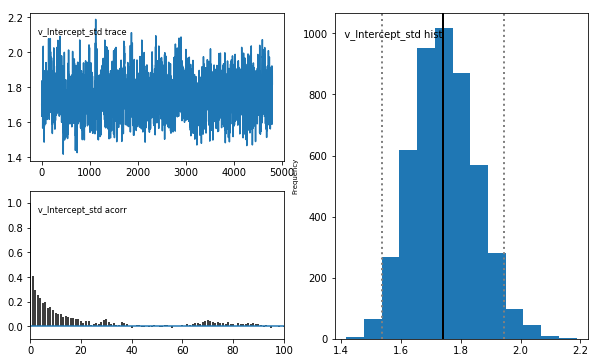

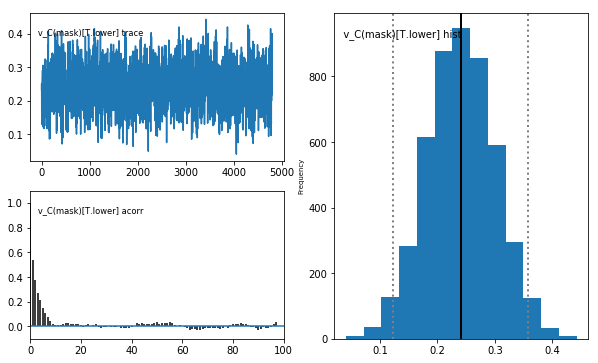

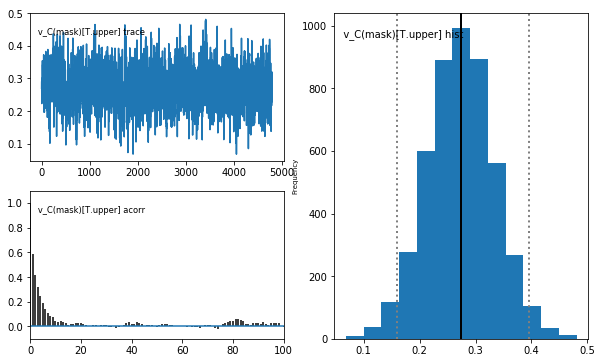

In [8]:
# run model
m_ha.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_ha.print_stats()
m_ha.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                      mean        std      2.5q       25q  \
a                                  2.40528   0.867426   2.14936   2.29619   
a_std                             0.963679      1.716  0.729104  0.832649   
a_subj.02hcv424u29nd5w             3.32074    0.80745   2.13619   2.74222   
a_subj.02k2uwlhgxnumn9              2.1297   0.670199   1.17571   1.64423   
a_subj.03g7h2hzq4o3g26             3.70993   0.644056   2.67575   3.25227   
a_subj.0nmr75cysk1ae0e             3.09162   0.487183   2.30378   2.73886   
a_subj.0t8qp67pqkw36cb             2.69382   0.494909   1.92559   2.33514   
a_subj.0vfpn4uf3t031qu             2.30721   0.744375   1.23654   1.75147   
a_subj.11dsfdtym1yy5mx              2.3674   0.708964   1.25376   1.84642   
a_subj.1d3dadyu4ekqb4q             2.38781   0.679518   1.40267    1.8841   
a_subj.1mt2emp4645cbl1             3.21805    0.72603   2.13916   2.69634   
a_subj.1rst24mbtgy9rc8             1.59951   0.297356   1.12478   1.38753   

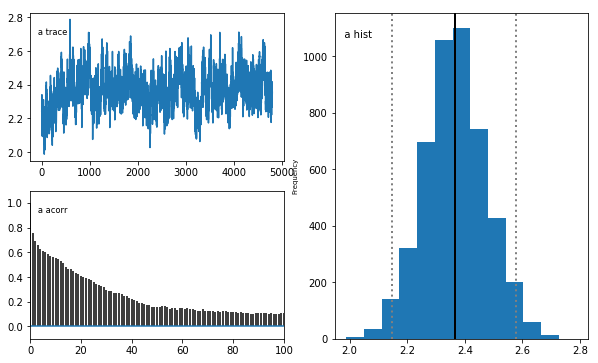

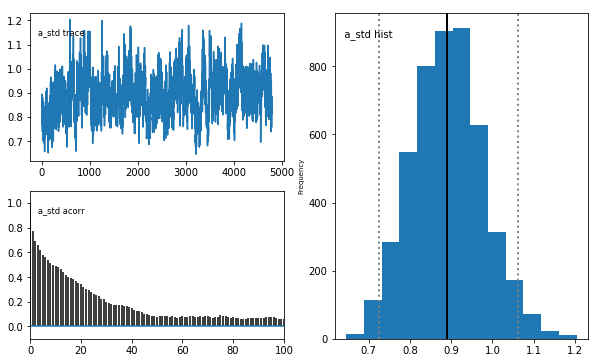

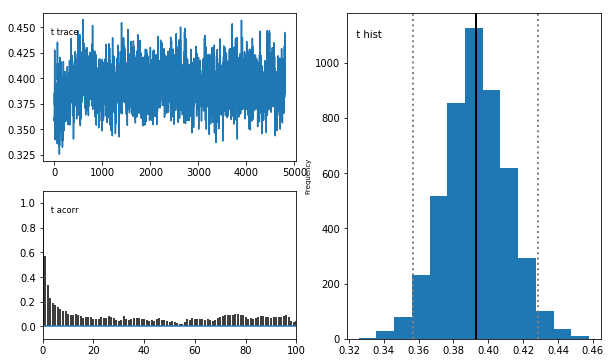

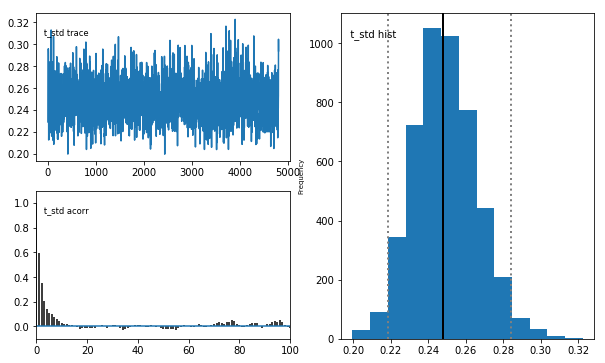

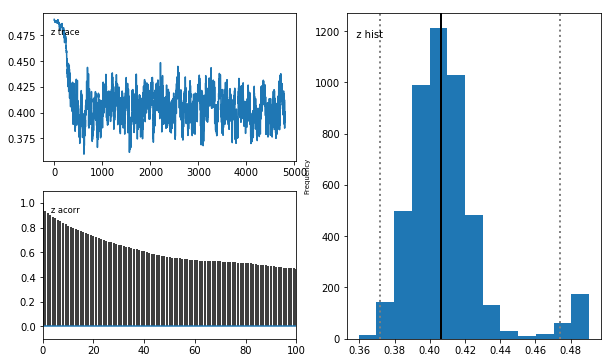

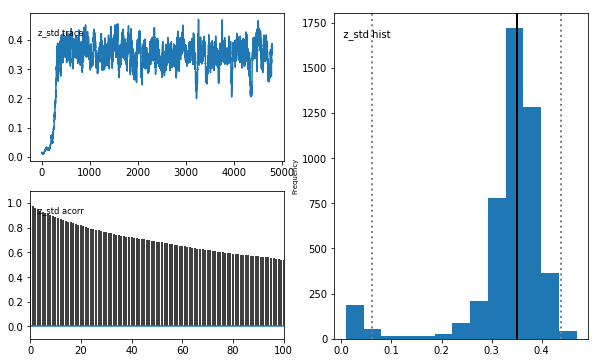

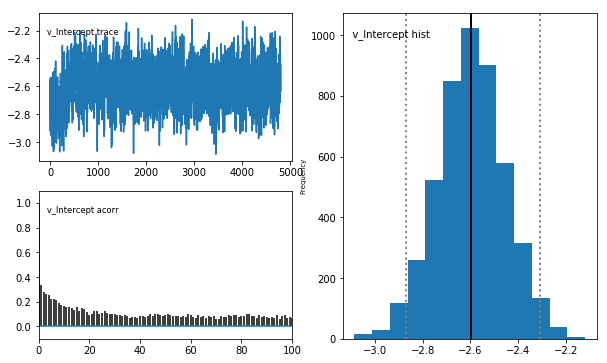

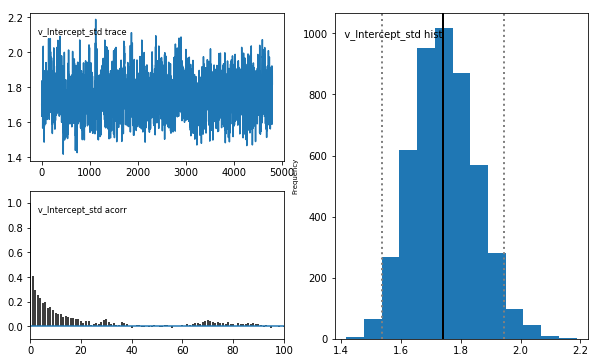

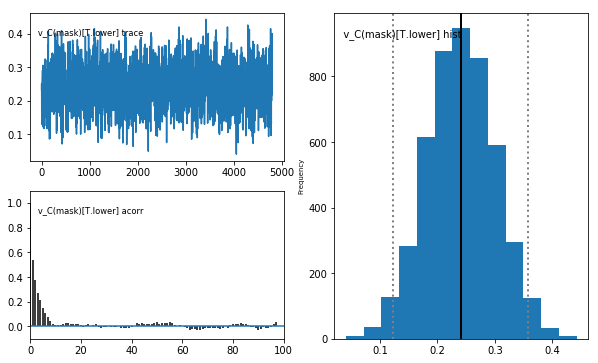

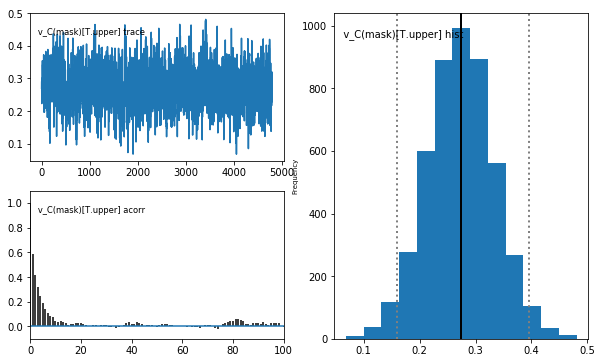

In [9]:
# save model stats
ha_stats = m_ha.gen_stats()
print(ha_stats)
ha_stats.to_csv('_maskFalsePositives/ha_5000/faceMask_hddm_drift_maskFalsePositives_ha_5000.csv', index=True)

# save model posterior plots
m_ha.plot_posteriors(path='_maskFalsePositives/ha_5000/_posteriors', save=True)

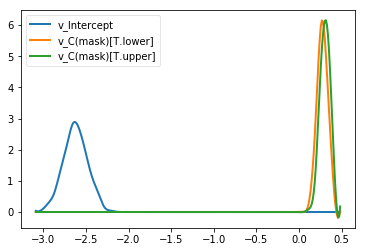

In [10]:
# plot model posteriors by mask
ha_v_none, ha_v_lower, ha_v_upper = m_ha.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([ha_v_none, ha_v_lower, ha_v_upper])
plt.savefig('_maskFalsePositives/ha_5000/faceMask_hddm_drift_maskFalsePositives_ha_5000_v_mask.pdf')

In [12]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(ha_v_none > 0) = ", (ha_v_none.trace() > 0).mean())
print("P(ha_v_lower < 0) = ", (ha_v_lower.trace() < 0).mean())
print("P(ha_v_upper < 0) = ", (ha_v_upper.trace() < 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(ha_v_lower > ha_v_upper) = ", (ha_v_lower.trace() > ha_v_upper.trace()).mean())

P(ha_v_none > 0) =  0.0
P(ha_v_lower < 0) =  0.0
P(ha_v_upper < 0) =  0.0
P(ha_v_lower > ha_v_upper) =  0.296041666667


In [13]:
# subset dataset by emotion rating type (happy) and facial expression (disgusted)
hd_data = data.loc[(data['emotionRating'] == 'happy') & (data['expression'] == 'disgusted')]
hd_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
322,gc2le9xecjp1stz,3,2,happy,327,_faces/23_M_D_U.jpg,23_M_D_U,23,M,disgusted,upper,0,-1.080050,0,50,0,0,0,0
326,gc2le9xecjp1stz,3,2,happy,331,_faces/23_M_D_L.jpg,23_M_D_L,23,M,disgusted,lower,0,-1.026850,0,50,0,0,0,0
328,gc2le9xecjp1stz,3,2,happy,333,_faces/16_F_D_L.jpg,16_F_D_L,16,F,disgusted,lower,0,-0.887705,0,50,0,0,0,0
333,gc2le9xecjp1stz,3,2,happy,338,_faces/32_F_D_L.jpg,32_F_D_L,32,F,disgusted,lower,0,-1.048170,0,50,0,0,0,0
343,gc2le9xecjp1stz,3,2,happy,348,_faces/05_M_D_L.jpg,05_M_D_L,5,M,disgusted,lower,0,-0.983245,0,50,0,0,0,0
346,gc2le9xecjp1stz,3,2,happy,351,_faces/01_F_D_L.jpg,01_F_D_L,1,F,disgusted,lower,0,-0.964055,0,50,0,0,0,0
351,gc2le9xecjp1stz,3,2,happy,356,_faces/01_F_D_X.jpg,01_F_D_X,1,F,disgusted,baseline,0,-0.983565,0,100,0,0,0,0
360,gc2le9xecjp1stz,3,2,happy,365,_faces/36_M_D_U.jpg,36_M_D_U,36,M,disgusted,upper,0,-1.414830,0,50,0,0,0,0
361,gc2le9xecjp1stz,3,2,happy,366,_faces/36_M_D_X.jpg,36_M_D_X,36,M,disgusted,baseline,0,-0.930355,0,100,0,0,0,0
363,gc2le9xecjp1stz,3,2,happy,368,_faces/05_M_D_U.jpg,05_M_D_U,5,M,disgusted,upper,0,-0.903955,0,50,0,0,0,0


In [14]:
# drop any subjects missing columns in design matrix (otherwise produces error)
# none in hd_data

In [15]:
# define model
m_hd = hddm.HDDMRegressor(hd_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


 [-----------------100%-----------------] 5001 of 5000 complete in 43081.7 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std        2.5q        25q        50q        75q      97.5q       mc err
a                                   2.09961   0.303749     1.95238    2.03696    2.08455    2.13278    2.24312    0.0143295
a_std                              0.788362   0.453718    0.651089   0.723112   0.766689   0.811416   0.911789    0.0204358
a_subj.02hcv424u29nd5w              2.86073   0.552615     1.98006    2.45692    2.80036    3.18304    4.10508    0.0165443
a_subj.02k2uwlhgxnumn9              1.96353   0.591102     1.11186    1.51843    1.86991     2.2733    3.42887    0.0279687
a_subj.03g7h2hzq4o3g26              3.70578   0.641966     2.69464    3.25815    3.62764    4.06784    5.18005    0.0207761
a_subj.0nmr75cysk1ae0e              2.49627   0.639105     1.56885    2.05426    2.39075    2.83063     4.0577    0.0260264
a_subj.0t8qp67pqkw36cb              2.29535   0.530359     1.49988    1.91092    2.21687    2.59272    3.52702    0.0198582
a_subj.0

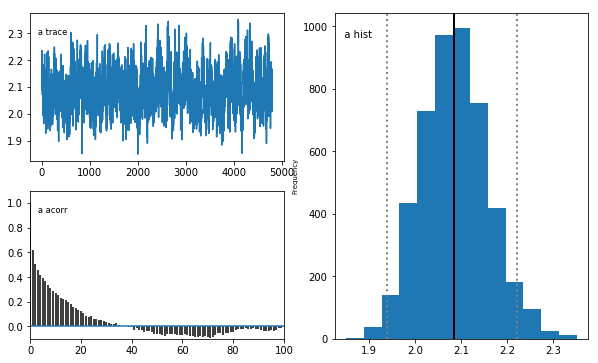

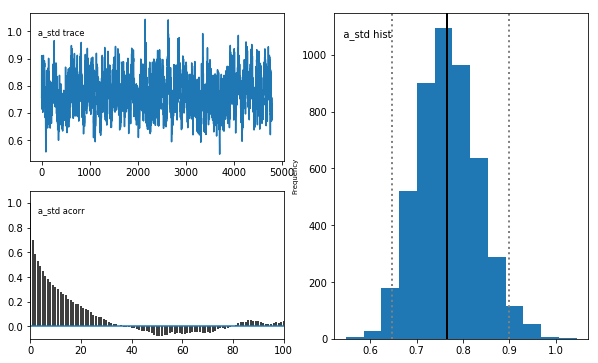

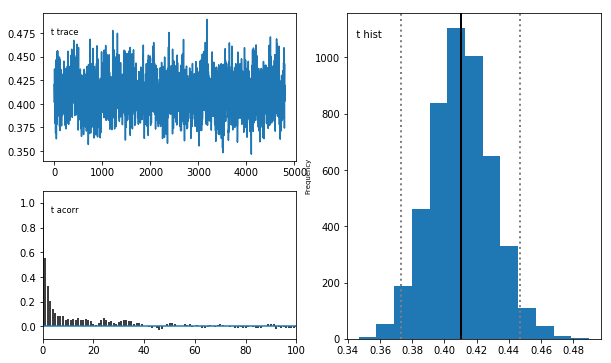

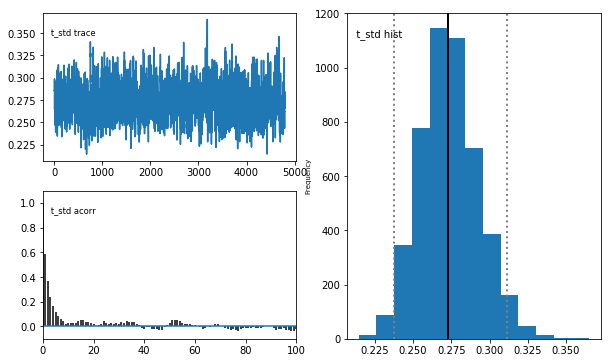

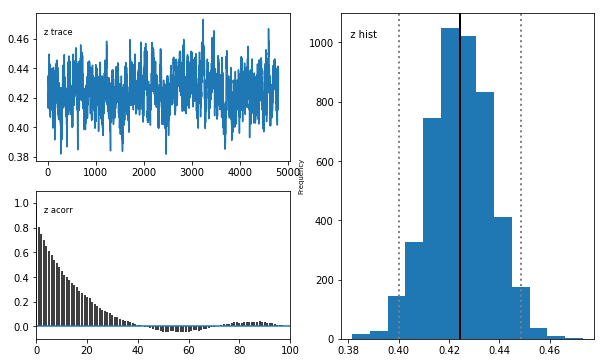

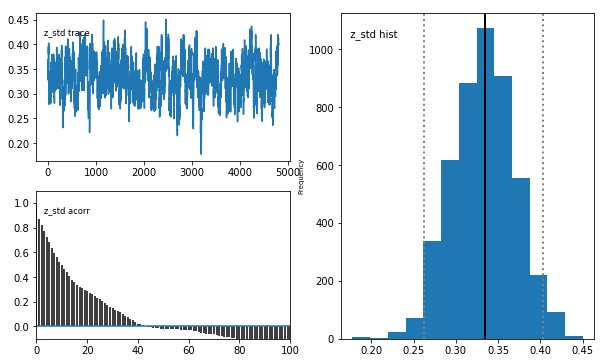

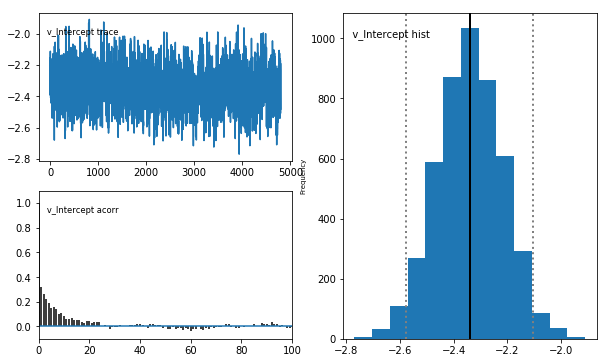

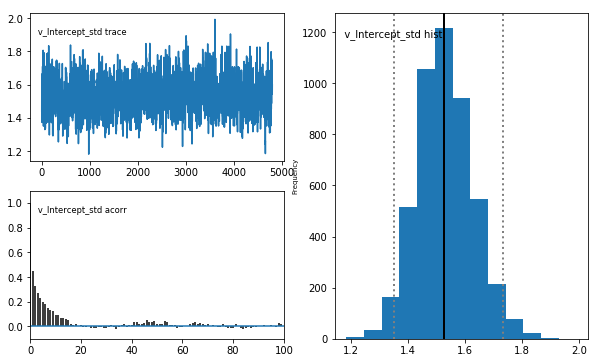

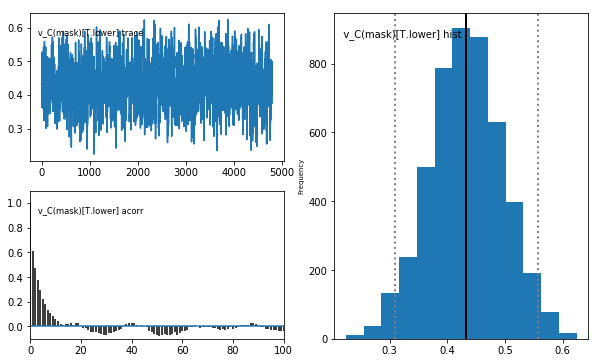

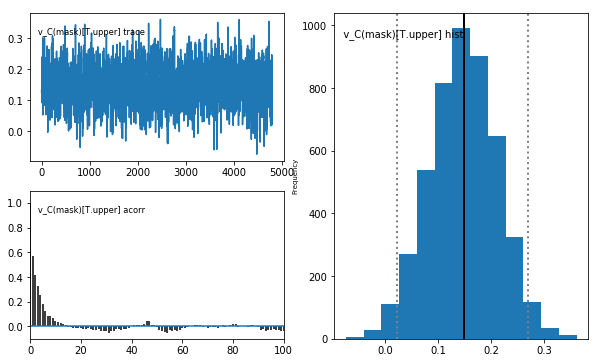

In [17]:
# run model
m_hd.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_hd.print_stats()
m_hd.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                      mean        std       2.5q       25q  \
a                                  2.09961   0.303749    1.95238   2.03696   
a_std                             0.788362   0.453718   0.651089  0.723112   
a_subj.02hcv424u29nd5w             2.86073   0.552615    1.98006   2.45692   
a_subj.02k2uwlhgxnumn9             1.96353   0.591102    1.11186   1.51843   
a_subj.03g7h2hzq4o3g26             3.70578   0.641966    2.69464   3.25815   
a_subj.0nmr75cysk1ae0e             2.49627   0.639105    1.56885   2.05426   
a_subj.0t8qp67pqkw36cb             2.29535   0.530359    1.49988   1.91092   
a_subj.0vfpn4uf3t031qu             1.44803   0.278536    1.00026   1.24252   
a_subj.11dsfdtym1yy5mx             2.59014   0.694653    1.48299    2.0826   
a_subj.1d3dadyu4ekqb4q             3.04859   0.744022    1.83119   2.50147   
a_subj.1mt2emp4645cbl1             3.12753   0.588343    2.20991   2.71039   
a_subj.1rst24mbtgy9rc8             1.67508   0.243247     1.2681

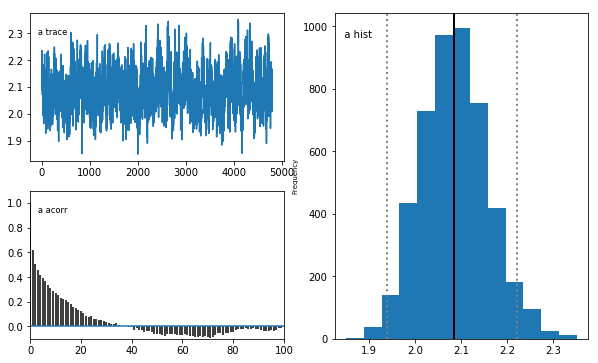

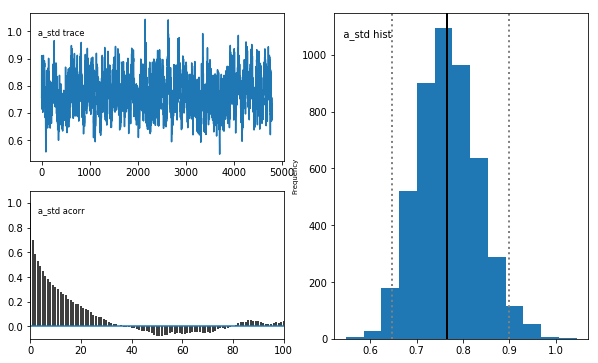

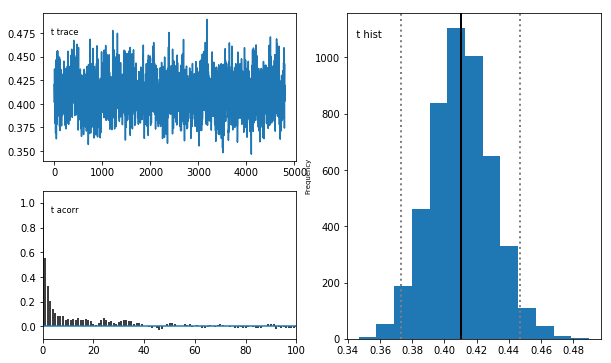

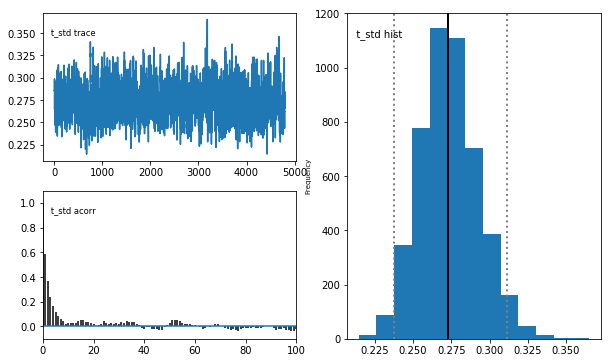

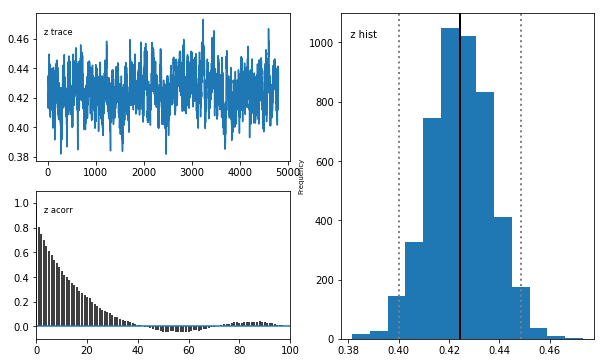

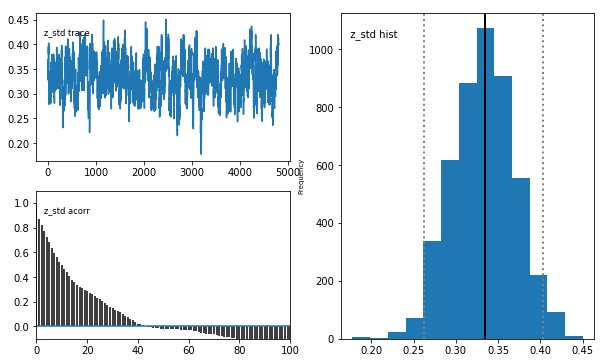

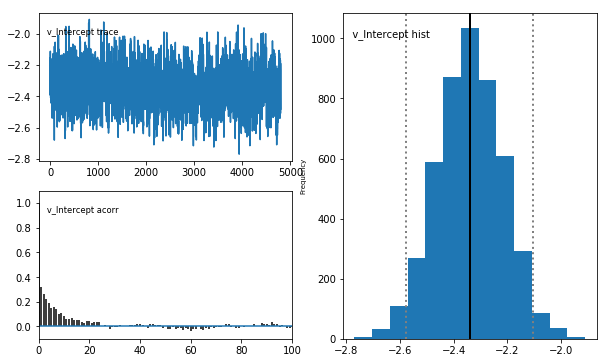

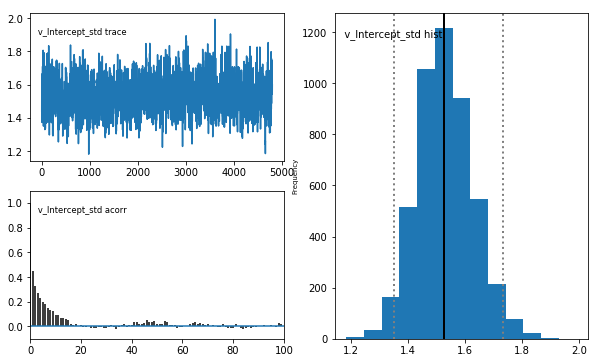

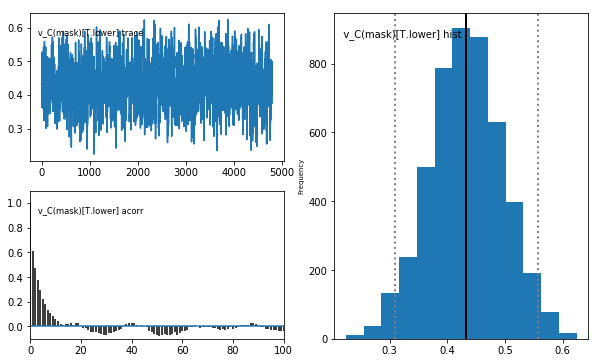

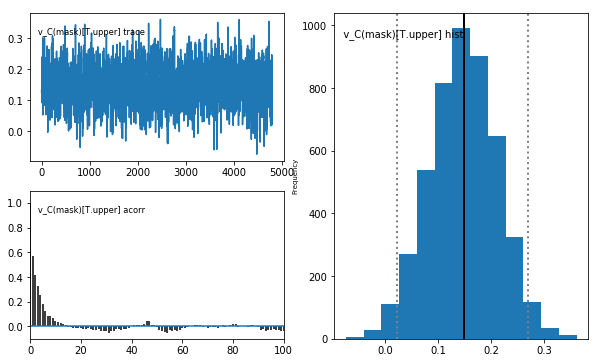

In [18]:
# save model stats
hd_stats = m_hd.gen_stats()
print(hd_stats)
hd_stats.to_csv('_maskFalsePositives/hd_5000/faceMask_hddm_drift_maskFalsePositives_hd_5000.csv', index=True)

# save model posterior plots
m_hd.plot_posteriors(path='_maskFalsePositives/hd_5000/_posteriors', save=True)

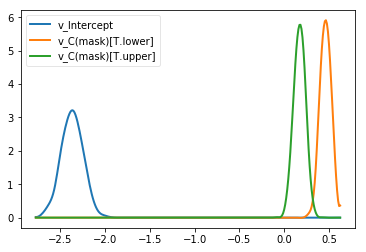

In [19]:
# plot model posteriors by mask
hd_v_none, hd_v_lower, hd_v_upper = m_hd.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([hd_v_none, hd_v_lower, hd_v_upper])
plt.savefig('_maskFalsePositives/hd_5000/faceMask_hddm_drift_maskFalsePositives_hd_5000_v_mask.pdf')

In [21]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(hd_v_none > 0) = ", (hd_v_none.trace() > 0).mean()) 
print("P(hd_v_lower < 0) = ", (hd_v_lower.trace() < 0).mean())
print("P(hd_v_upper < 0) = ", (hd_v_upper.trace() < 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(hd_v_lower < hd_v_upper) = ", (hd_v_lower.trace() < hd_v_upper.trace()).mean())

P(hd_v_none > 0) =  0.0
P(hd_v_lower < 0) =  0.0
P(hd_v_upper < 0) =  0.01
P(hd_v_lower < hd_v_upper) =  0.0


In [22]:
# subset dataset by emotion rating type (happy) and facial expression (sad)
hs_data = data.loc[(data['emotionRating'] == 'happy') & (data['expression'] == 'sad')]
hs_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
331,gc2le9xecjp1stz,3,2,happy,336,_faces/12_F_S_L.jpg,12_F_S_L,12,F,sad,lower,0,-0.986905,0,0,0,0,50,0
340,gc2le9xecjp1stz,3,2,happy,345,_faces/15_M_S_L.jpg,15_M_S_L,15,M,sad,lower,0,-1.039030,0,0,0,0,50,0
349,gc2le9xecjp1stz,3,2,happy,354,_faces/27_F_S_U.jpg,27_F_S_U,27,F,sad,upper,0,-0.938955,0,0,0,0,50,0
352,gc2le9xecjp1stz,3,2,happy,357,_faces/27_F_S_X.jpg,27_F_S_X,27,F,sad,baseline,0,-1.050430,0,0,0,0,100,0
354,gc2le9xecjp1stz,3,2,happy,359,_faces/49_M_S_X.jpg,49_M_S_X,49,M,sad,baseline,0,-1.346700,0,0,0,0,100,0
358,gc2le9xecjp1stz,3,2,happy,363,_faces/58_F_S_X.jpg,58_F_S_X,58,F,sad,baseline,0,-1.177535,0,0,0,0,100,0
370,gc2le9xecjp1stz,3,2,happy,375,_faces/58_F_S_L.jpg,58_F_S_L,58,F,sad,lower,0,-0.805965,0,0,0,0,50,0
372,gc2le9xecjp1stz,3,2,happy,377,_faces/27_F_S_L.jpg,27_F_S_L,27,F,sad,lower,0,-0.886265,0,0,0,0,50,0
376,gc2le9xecjp1stz,3,2,happy,381,_faces/30_M_S_U.jpg,30_M_S_U,30,M,sad,upper,0,-1.130465,0,0,0,0,50,0
384,gc2le9xecjp1stz,3,2,happy,389,_faces/15_M_S_X.jpg,15_M_S_X,15,M,sad,baseline,0,-0.780010,0,0,0,0,100,0


In [23]:
# drop any subjects missing columns in design matrix (otherwise produces error)
hs_data = hs_data[(hs_data.subj_idx != 'tc72s89kg5xex0v') & (hs_data.subj_idx != 'c6r924wdcxtkolt')]

In [24]:
# define model
m_hs = hddm.HDDMRegressor(hs_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


 [-----------------100%-----------------] 5001 of 5000 complete in 34907.9 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std        2.5q        25q        50q        75q      97.5q       mc err
a                                   2.32186   0.402773     2.12855    2.23526    2.29731    2.36415    2.51134      0.02034
a_std                              0.918884   0.736684    0.737524   0.828063   0.880037   0.937409    1.06997    0.0342334
a_subj.02hcv424u29nd5w              2.19986   0.357329     1.63526    1.94445    2.15056    2.40715     3.0069   0.00998762
a_subj.02k2uwlhgxnumn9              2.07255   0.675859     1.11482    1.57765    1.95503    2.42754     3.7557    0.0354373
a_subj.03g7h2hzq4o3g26              4.22494    0.66069     3.16146    3.76274    4.15594    4.60375    5.80273    0.0164504
a_subj.0nmr75cysk1ae0e              2.11173   0.330778     1.55042     1.8794     2.0866    2.31045    2.82866   0.00796273
a_subj.0t8qp67pqkw36cb              2.34999   0.625822     1.41847     1.9095    2.26149    2.67911    3.91862    0.0262698
a_subj.0

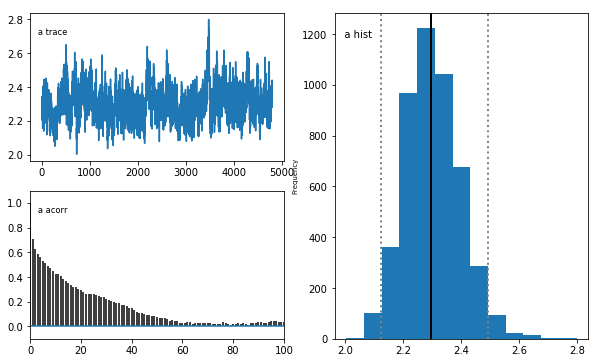

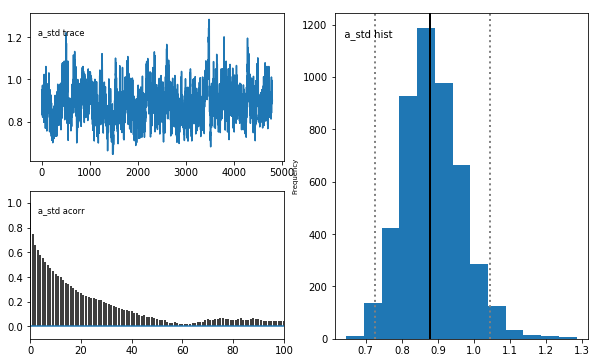

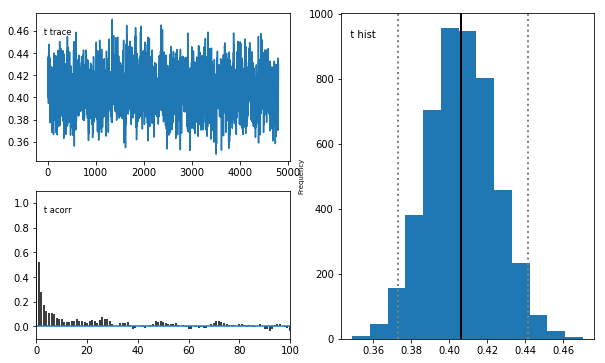

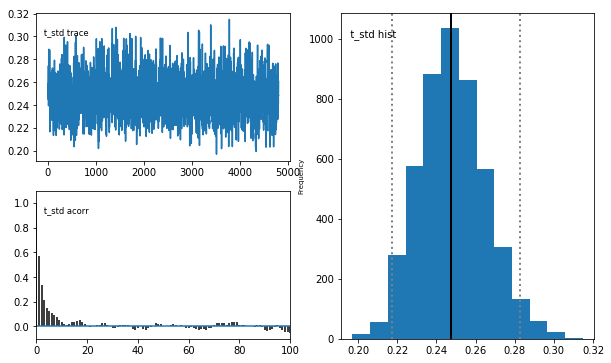

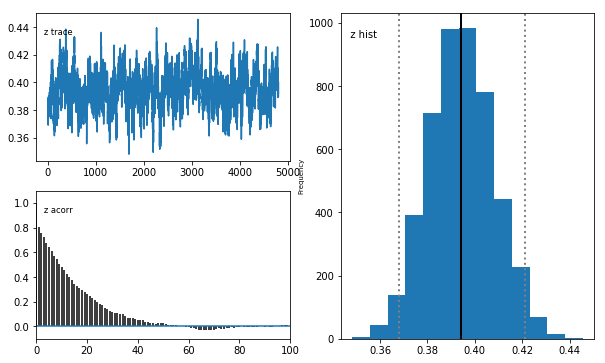

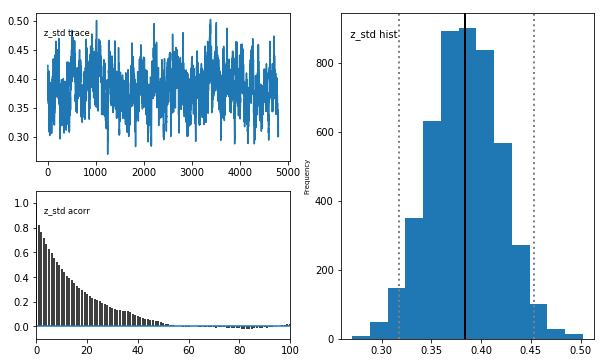

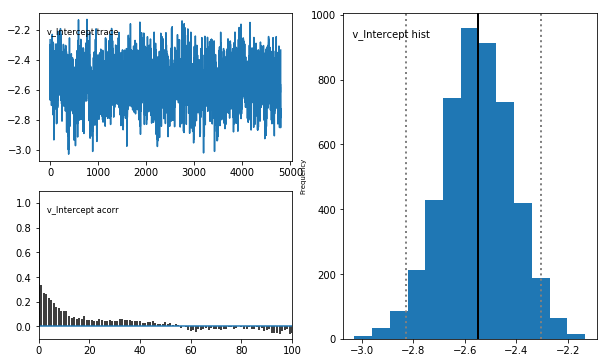

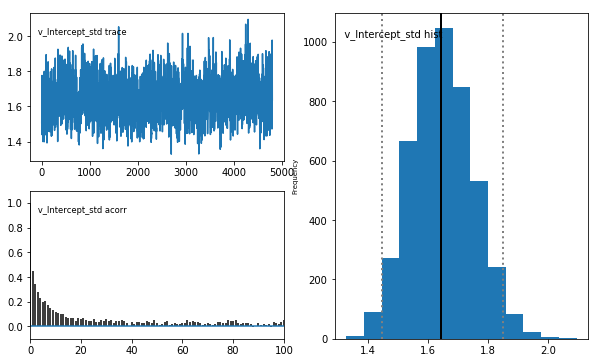

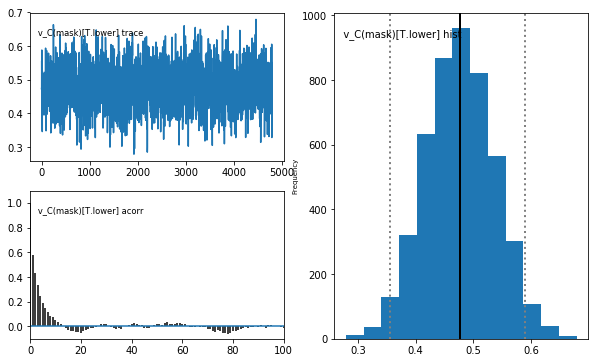

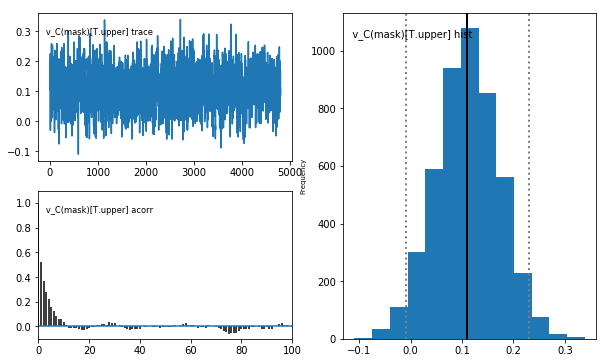

In [26]:
# run model
m_hs.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_hs.print_stats()
m_hs.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                      mean        std       2.5q        25q  \
a                                  2.32186   0.402773    2.12855    2.23526   
a_std                             0.918884   0.736684   0.737524   0.828063   
a_subj.02hcv424u29nd5w             2.19986   0.357329    1.63526    1.94445   
a_subj.02k2uwlhgxnumn9             2.07255   0.675859    1.11482    1.57765   
a_subj.03g7h2hzq4o3g26             4.22494    0.66069    3.16146    3.76274   
a_subj.0nmr75cysk1ae0e             2.11173   0.330778    1.55042     1.8794   
a_subj.0t8qp67pqkw36cb             2.34999   0.625822    1.41847     1.9095   
a_subj.0vfpn4uf3t031qu             2.27392   0.672448    1.24788    1.79993   
a_subj.11dsfdtym1yy5mx             2.24788   0.461511    1.53908    1.92284   
a_subj.1d3dadyu4ekqb4q             1.52533   0.305847    1.03299    1.30566   
a_subj.1mt2emp4645cbl1             3.16835   0.823634    1.99296    2.58027   
a_subj.1rst24mbtgy9rc8             2.01521   0.63559

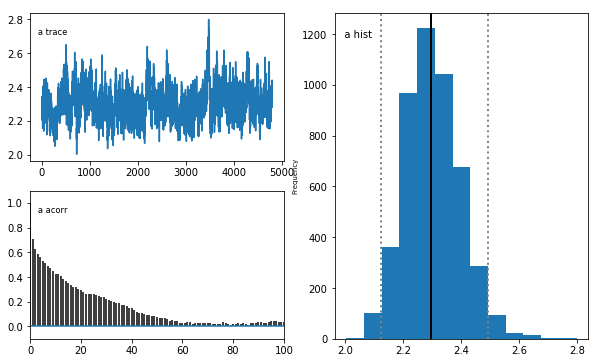

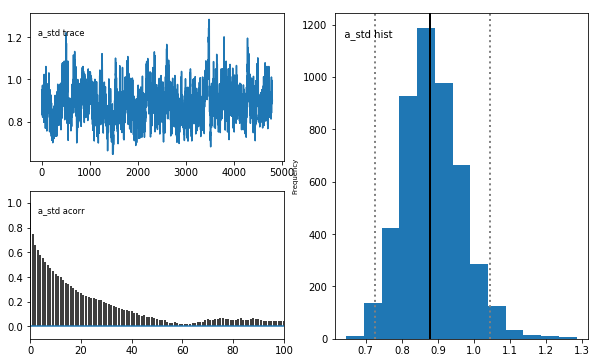

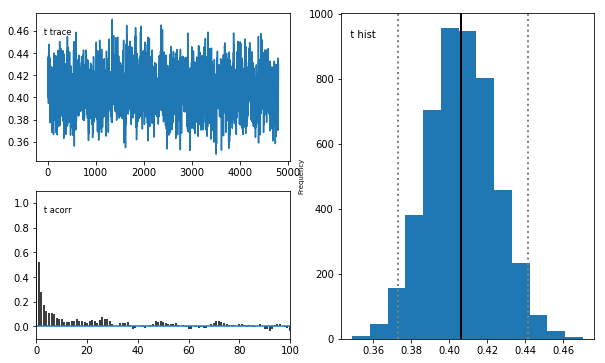

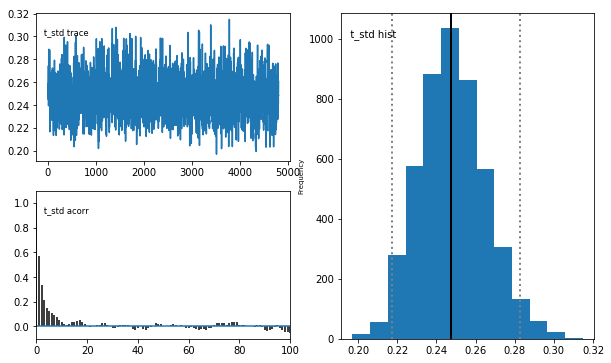

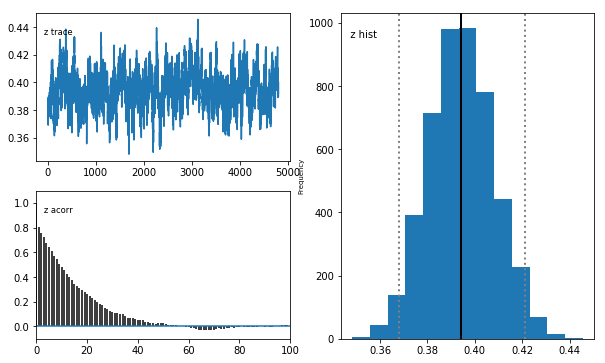

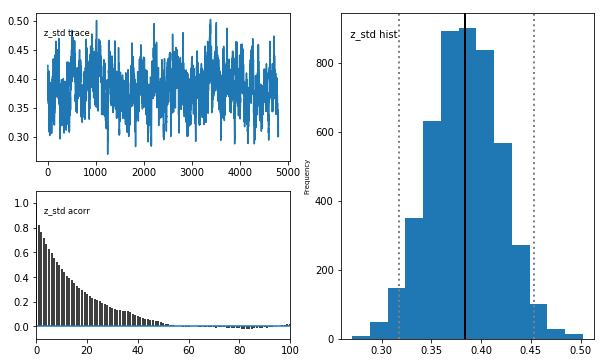

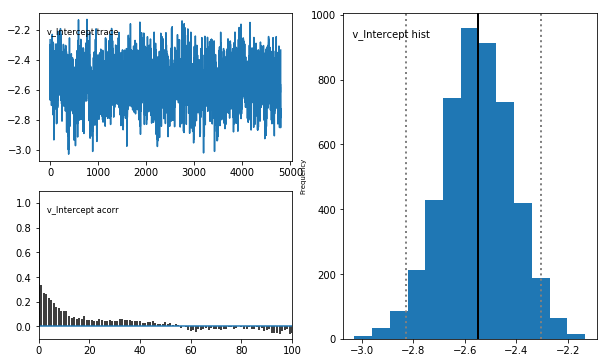

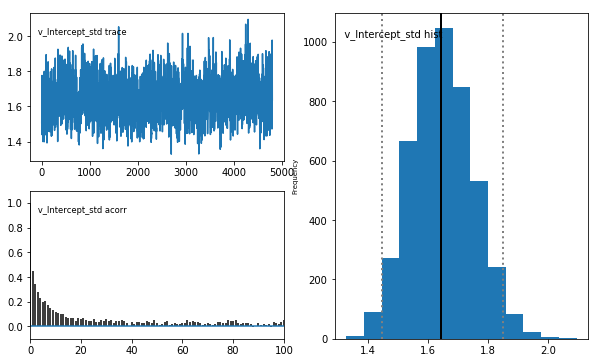

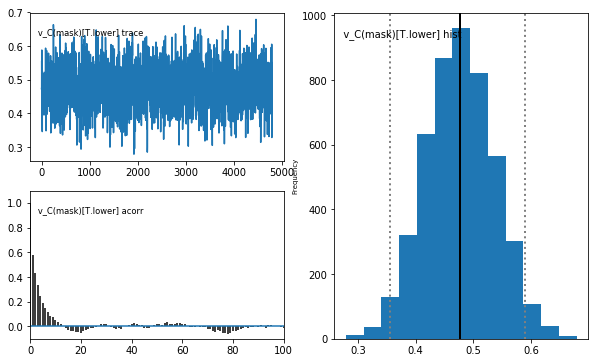

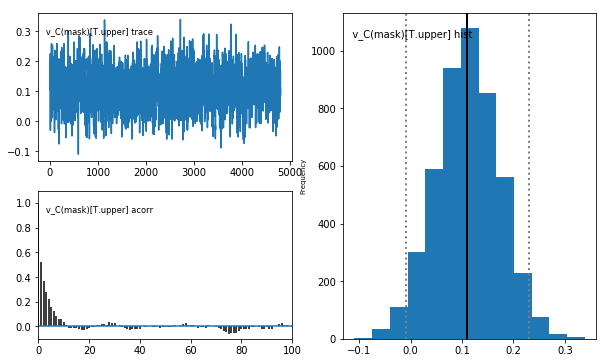

In [27]:
# save model stats
hs_stats = m_hs.gen_stats()
print(hs_stats)
hs_stats.to_csv('_maskFalsePositives/hs_5000/faceMask_hddm_drift_maskFalsePositives_hs_5000.csv', index=True)

# save model posterior plots
m_hs.plot_posteriors(path='_maskFalsePositives/hs_5000/_posteriors', save=True)

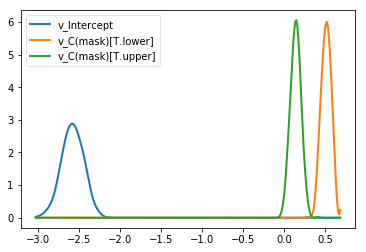

In [28]:
# plot model posteriors by mask
hs_v_none, hs_v_lower, hs_v_upper = m_hs.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([hs_v_none, hs_v_lower, hs_v_upper])
plt.savefig('_maskFalsePositives/hs_5000/faceMask_hddm_drift_maskFalsePositives_hs_5000_v_mask.pdf')

In [30]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(hs_v_none > 0) = ", (hs_v_none.trace() > 0).mean()) 
print("P(hs_v_lower < 0) = ", (hs_v_lower.trace() < 0).mean())
print("P(hs_v_upper < 0) = ", (hs_v_upper.trace() < 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(hs_v_lower < hs_v_upper) = ", (hs_v_lower.trace() < hs_v_upper.trace()).mean())

P(hs_v_none > 0) =  0.0
P(hs_v_lower < 0) =  0.0
P(hs_v_upper < 0) =  0.03875
P(hs_v_lower < hs_v_upper) =  0.0


In [34]:
# subset dataset by emotion rating type (happy) and facial expression (surprised)
hr_data = data.loc[(data['emotionRating'] == 'happy') & (data['expression'] == 'surprised')]
hr_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
334,gc2le9xecjp1stz,3,2,happy,339,_faces/57_F_R_X.jpg,57_F_R_X,57,F,surprised,baseline,0,-1.304920,0,0,0,0,0,100
344,gc2le9xecjp1stz,3,2,happy,349,_faces/47_M_R_X.jpg,47_M_R_X,47,M,surprised,baseline,0,-1.059725,0,0,0,0,0,100
348,gc2le9xecjp1stz,3,2,happy,353,_faces/10_M_R_U.jpg,10_M_R_U,10,M,surprised,upper,0,-0.927720,0,0,0,0,0,50
355,gc2le9xecjp1stz,3,2,happy,360,_faces/08_F_R_U.jpg,08_F_R_U,8,F,surprised,upper,0,-1.197445,0,0,0,0,0,50
357,gc2le9xecjp1stz,3,2,happy,362,_faces/08_F_R_L.jpg,08_F_R_L,8,F,surprised,lower,0,-0.913700,0,0,0,0,0,50
359,gc2le9xecjp1stz,3,2,happy,364,_faces/47_M_R_U.jpg,47_M_R_U,47,M,surprised,upper,0,-1.156205,0,0,0,0,0,50
362,gc2le9xecjp1stz,3,2,happy,367,_faces/47_M_R_L.jpg,47_M_R_L,47,M,surprised,lower,0,-0.970645,0,0,0,0,0,50
368,gc2le9xecjp1stz,3,2,happy,373,_faces/28_M_R_U.jpg,28_M_R_U,28,M,surprised,upper,0,-1.047670,0,0,0,0,0,50
371,gc2le9xecjp1stz,3,2,happy,376,_faces/28_M_R_L.jpg,28_M_R_L,28,M,surprised,lower,0,-0.947610,0,0,0,0,0,50
377,gc2le9xecjp1stz,3,2,happy,382,_faces/28_M_R_X.jpg,28_M_R_X,28,M,surprised,baseline,0,-0.933335,0,0,0,0,0,100


In [35]:
# drop any subjects missing columns in design matrix (otherwise produces error)
hr_data = hr_data[(hr_data.subj_idx != 'ygpcur698h4dcw5') & (hr_data.subj_idx != 'g6ugveruaftjkb1')]

In [36]:
# define model
m_hr = hddm.HDDMRegressor(hr_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


 [-----------------100%-----------------] 5001 of 5000 complete in 34238.5 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std        2.5q        25q        50q         75q        97.5q       mc err
a                                   2.06928   0.594508     1.91961    1.99883    2.04406     2.08801      2.18199    0.0251424
a_std                              0.775279   0.905627    0.635889   0.700043   0.736253    0.777807     0.864355    0.0358695
a_subj.02hcv424u29nd5w               1.9158   0.245682      1.4982    1.74226    1.89381     2.06287      2.44685   0.00639686
a_subj.02k2uwlhgxnumn9              2.38121   0.565687     1.51158    1.98343    2.29864     2.70322      3.71833    0.0183737
a_subj.03g7h2hzq4o3g26              3.69712   0.614744     2.70391    3.25232    3.63715     4.07157      5.07015    0.0194885
a_subj.0nmr75cysk1ae0e              2.26534     0.2636     1.81094    2.07964    2.24683      2.4285      2.84765   0.00513684
a_subj.0t8qp67pqkw36cb                2.357   0.403948     1.70779     2.0654     2.3131     2.58853      3.293

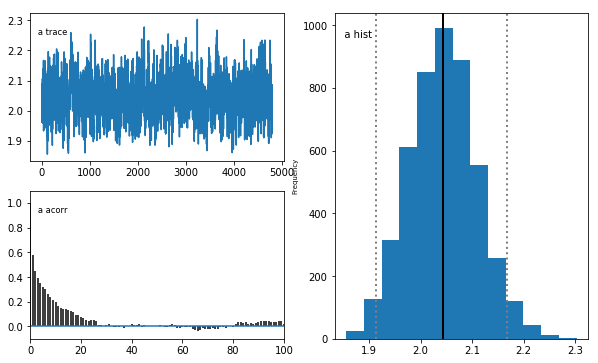

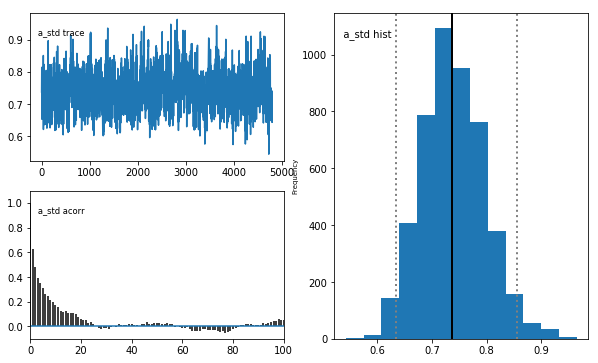

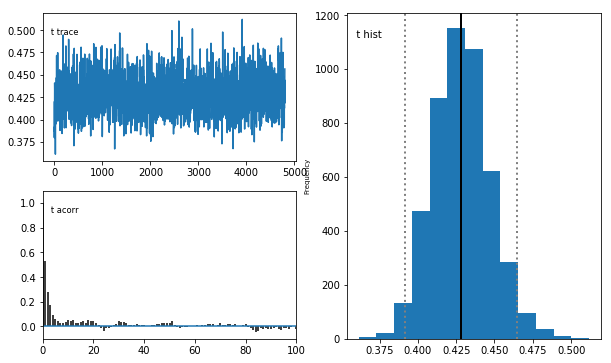

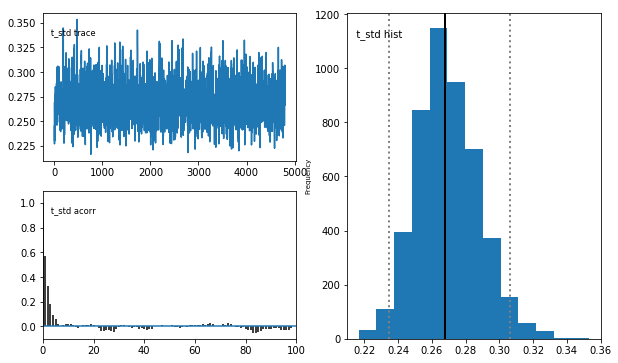

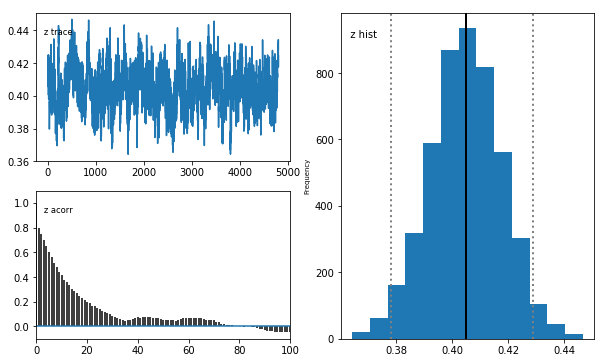

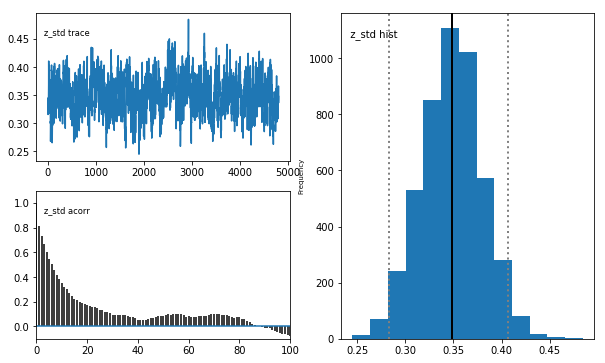

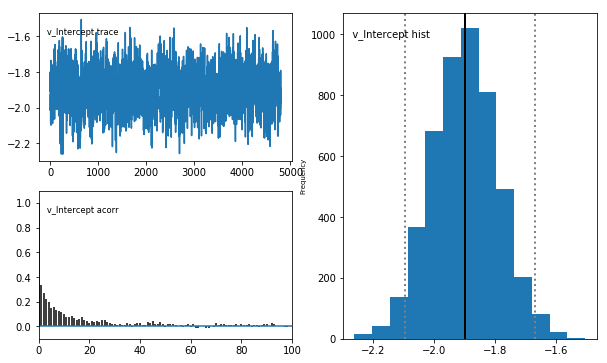

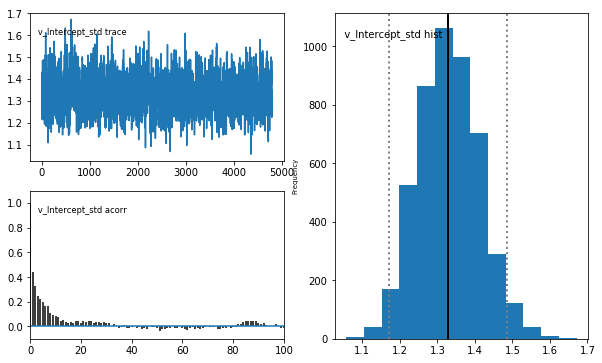

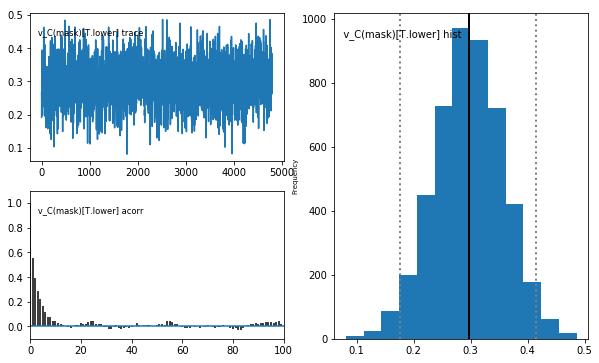

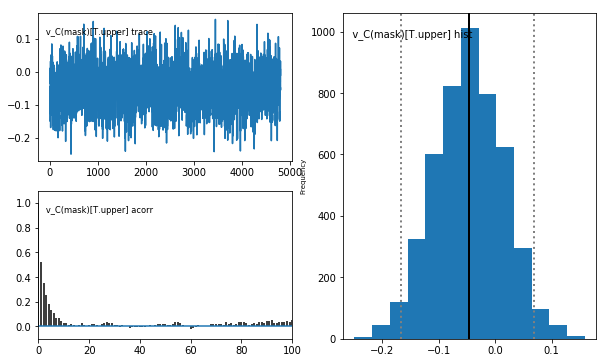

In [38]:
# run model
m_hr.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_hr.print_stats()
m_hr.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std      2.5q        25q  \
a                                   2.06928   0.594508   1.91961    1.99883   
a_std                              0.775279   0.905627  0.635889   0.700043   
a_subj.02hcv424u29nd5w               1.9158   0.245682    1.4982    1.74226   
a_subj.02k2uwlhgxnumn9              2.38121   0.565687   1.51158    1.98343   
a_subj.03g7h2hzq4o3g26              3.69712   0.614744   2.70391    3.25232   
a_subj.0nmr75cysk1ae0e              2.26534     0.2636   1.81094    2.07964   
a_subj.0t8qp67pqkw36cb                2.357   0.403948   1.70779     2.0654   
a_subj.0vfpn4uf3t031qu              2.10149   0.573812   1.19959    1.69027   
a_subj.11dsfdtym1yy5mx              2.17588   0.568758   1.32821    1.77202   
a_subj.1d3dadyu4ekqb4q              1.28331   0.205053   0.94958    1.13455   
a_subj.1mt2emp4645cbl1              3.32508   0.581149   2.39731    2.90933   
a_subj.1rst24mbtgy9rc8              1.32319   0.2413

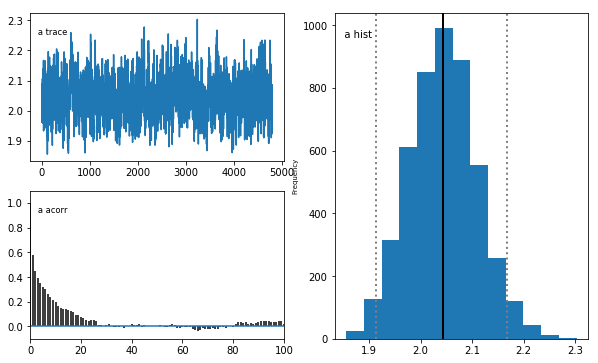

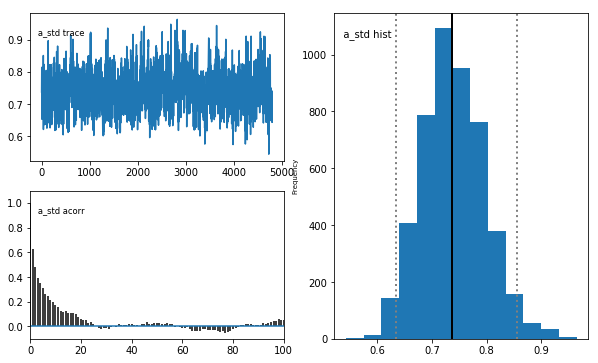

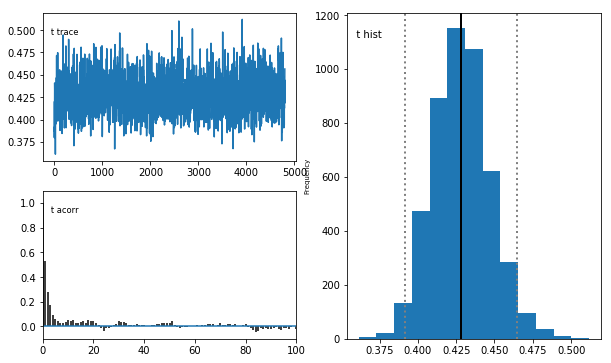

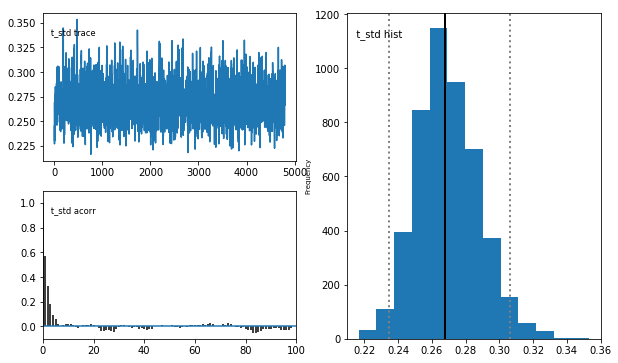

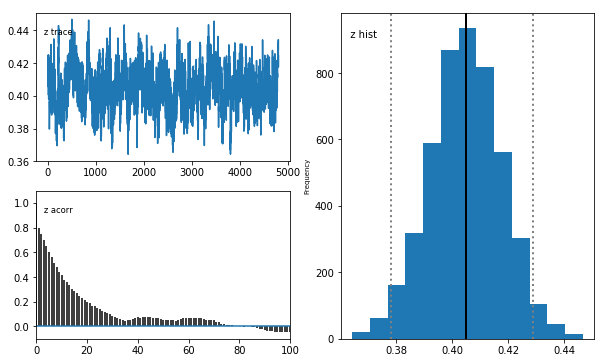

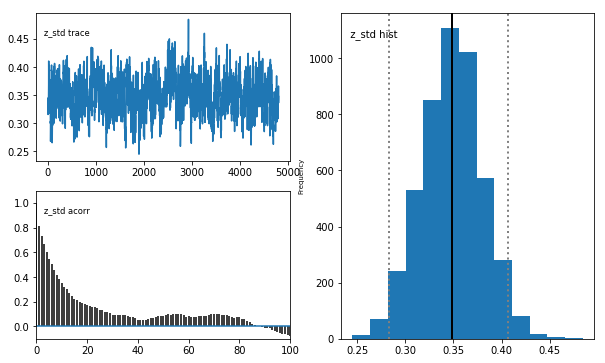

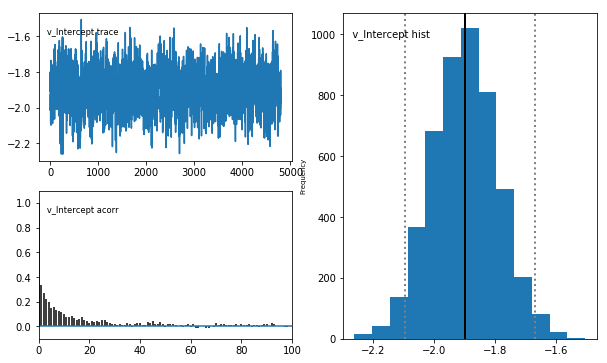

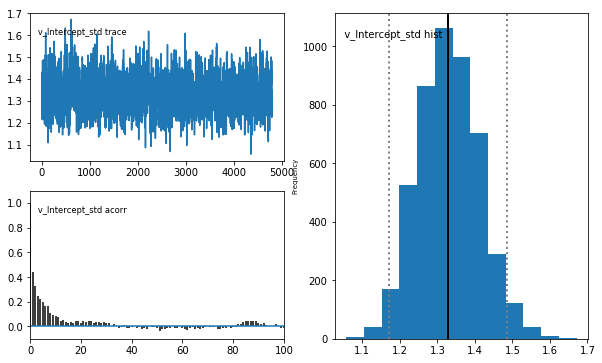

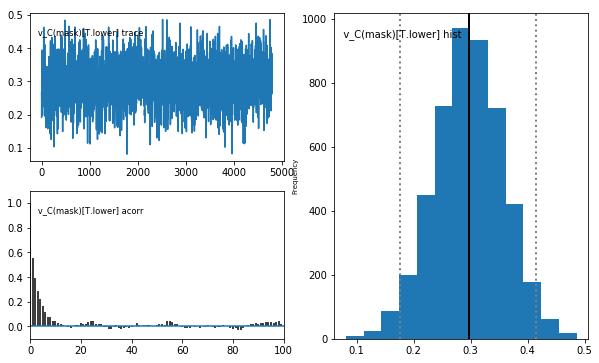

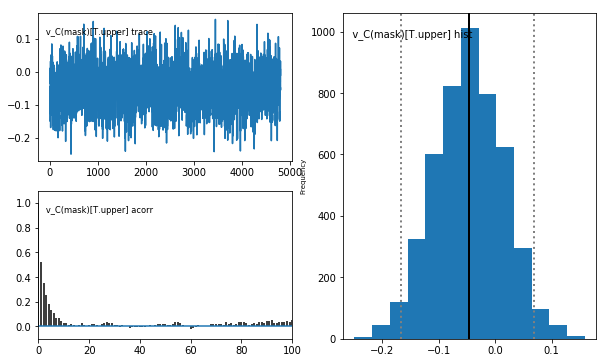

In [39]:
# save model stats
hr_stats = m_hr.gen_stats()
print(hr_stats)
hr_stats.to_csv('_maskFalsePositives/hr_5000/faceMask_hddm_drift_maskFalsePositives_hr_5000.csv', index=True)

# save model posterior plots
m_hr.plot_posteriors(path='_maskFalsePositives/hr_5000/_posteriors', save=True)

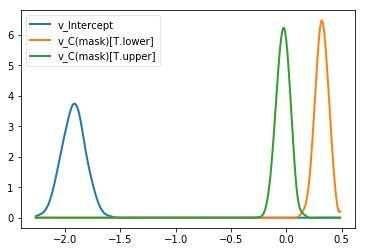

In [40]:
# plot model posteriors by mask
hr_v_none, hr_v_lower, hr_v_upper = m_hr.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([hr_v_none, hr_v_lower, hr_v_upper])
plt.savefig('_maskFalsePositives/hr_5000/faceMask_hddm_drift_maskFalsePositives_hr_5000_v_mask.pdf')

In [42]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(hr_v_none > 0) = ", (hr_v_none.trace() > 0).mean()) 
print("P(hr_v_lower < 0) = ", (hr_v_lower.trace() < 0).mean())
print("P(hr_v_upper > 0) = ", (hr_v_upper.trace() > 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(hr_v_lower < hr_v_upper) = ", (hr_v_lower.trace() < hr_v_upper.trace()).mean())

P(hr_v_none > 0) =  0.0
P(hr_v_lower < 0) =  0.0
P(hr_v_upper > 0) =  0.232708333333
P(hr_v_lower < hr_v_upper) =  0.0
